In [2]:
#%matplotlib inline
import numpy as np
import matplotlib.pyplot as mpl
import matplotlib.patches as mpa
import astropy.wcs as pywcs
from astropy.io import fits as pyfits
import scipy.ndimage as snd

import matplotlib.cm as cm
from astropy.utils.data import get_pkg_data_filename
#import subprocess as sp
#from astropy.table import Table, hstack, join, Column
#import sys
#import os

from astropy.io import ascii
#import urllib
from pandas.plotting import table 
import pandas as pd
# from astropy.utils.data import get_pkg_data_filename
# import subprocess as sp
import glob
# from astropy.table import Table, hstack, join
# import sys
# import os
# from astropy.io import ascii
# from astropy.table import Column

In [3]:
#cat = ascii.read('/data1/rowland/')

In [4]:
#Bruno's code to get outlines of fields
# coding: utf-8

def create_footprint(data,header, debug=False):
    imgMask = np.zeros_like(data)
    smoothData = snd.gaussian_filter(data,sigma=2) # to smooth over artifacts
    imgMask[smoothData!=0] = 1 # mask non-zero pixels
    if debug is True:
        fig,ax = mpl.subplots(figsize=(18,16))
        ax.imshow(smoothData,vmin=0,vmax=0.5)
        cntr = ax.contour(imgMask,levels=[0.5],zorder=10,colors="white")
    else:
        cntr = mpl.contour(imgMask,levels=[0.5]) # contour separating 0 and 1 pixels
        mpl.close("all")
    dataSegments = cntr.allsegs
    
    sky_coords_all = []
    
    for i in range(len(dataSegments[0])):
        polygon = dataSegments[0][i] # get contour pixel coordinates
        wcs = pywcs.WCS(header)
        sky_coords = wcs.all_pix2world(polygon,1) # transform pixel to sky coordinates
        sky_coords_all.append(sky_coords)
    return sky_coords_all



#amended code

def select_object_segmap(segmap,index):
    Regions = np.zeros_like(segmap)
    if index not in segmap:
        raise ValueError('index not in segmentation map')
    #print(np.where(segmap==index))
    Regions[segmap==index]=index
    return Regions

#brunos code
def create_mask(filter,star_table):
    masterdata = ascii.read('/run/media/rowland/PURPLEDRIVE/mastertable')
    segmap_file = pyfits.open('/run/media/rowland/PURPLEDRIVE/segmaps_check/{}_check.fits'.format(filter))#[0].data
    segmap = segmap_file[0].data    

    regions = np.zeros_like(segmap)
    for detection in star_table:
        index = detection['NUMBER'.format(filter)]
        if isinstance(index,np.int64):
            regions += select_object_segmap(segmap,index)
    return segmap,regions 

In [6]:
#if needed

masterdata = ascii.read('/run/media/rowland/PURPLEDRIVE/mastertable')
#masterdata

In [7]:
catalog = ascii.read('/data1/rowland/LensedCatalogs/remaining_objects_F105W.cat')
#catalog = pd.read_table('/data1/rowland/LensedCatalogs/remaining_objects_F105W.cat')
catalog=catalog[np.where(catalog['ISOAREA_IMAGE']>=10)]
catalog
# #catalog.write??

# import matplotlib.pyplot as plt
# import pandas as pd
# #from pandas.table.plotting import table # EDIT: see deprecation warnings below

# ax = mpl.subplot(111, frame_on=False) # no visible frame
# ax.xaxis.set_visible(False)  # hide the x axis
# ax.yaxis.set_visible(False)  # hide the y axis

# table(ax, catalog)  # where df is your data frame

# mpl.savefig('mytable.png')

NUMBER,MAG_AUTO,MAGERR_AUTO,KRON_RADIUS,ISOAREA_IMAGE,XPEAK_IMAGE,YPEAK_IMAGE,X_IMAGE,Y_IMAGE,ALPHA_J2000,DELTA_J2000,A_IMAGE,THETA_IMAGE,MU_MAX,ELLIPTICITY,CLASS_STAR,FLUX_RADIUS
,mag,mag,,pix2,pix,pix,pix,pix,deg,deg,pix,deg,mag / arcsec2,,,pix
int64,float64,float64,float64,int64,int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
1,18.2115,0.0003,3.5,10394,1667,842,1667.4456,842.0095,0.0,0.0,20.063,40.09,17.5056,0.514,0.976,10.425
6,27.4044,0.108,3.5,15,2128,211,2126.7473,210.5854,0.0,0.0,1.224,-12.8,24.1666,0.248,0.347,1.901
7,27.6278,0.1103,3.5,10,2087,198,2087.4797,198.5206,0.0,0.0,1.019,74.17,24.3573,0.287,0.384,1.671
9,27.6265,0.1341,3.79,11,2078,204,2077.8296,202.382,0.0,0.0,1.474,80.47,24.4349,0.549,0.349,1.924
12,24.1083,0.0188,3.98,181,2085,236,2086.7354,235.9438,0.0,0.0,3.569,-24.62,22.2314,0.135,0.64,4.021
15,27.0168,0.1082,4.33,18,2103,212,2101.8247,212.4235,0.0,0.0,1.33,-88.52,24.2577,0.161,0.349,2.298
19,27.554,0.1082,3.5,11,2072,212,2071.168,212.3452,0.0,0.0,1.325,-4.76,24.3542,0.53,0.364,1.828
22,26.1125,0.0791,4.88,39,2111,234,2110.3308,235.2508,0.0,0.0,3.084,-50.27,23.3661,0.655,0.57,2.999


In [8]:
# for row in catalog:
#     if row['MAG_AUTO'] == 99.0: #these even have negative flux radius so these are clearly noise/bad fits
#         print(row)
#     else:
#         continue

28.2876 F435W (1211,)
28.5459 F606W (8122,)
27.0515 F625W (3605,)
28.0467 F775W (4000,)
27.4158 F814W (2106,)
28.4045 F850LP (2724,)
28.6561 F105W (5518,)
28.8987 F125W (4326,)
26.5613 F140W (4009,)
28.2922 F160W (5710,)


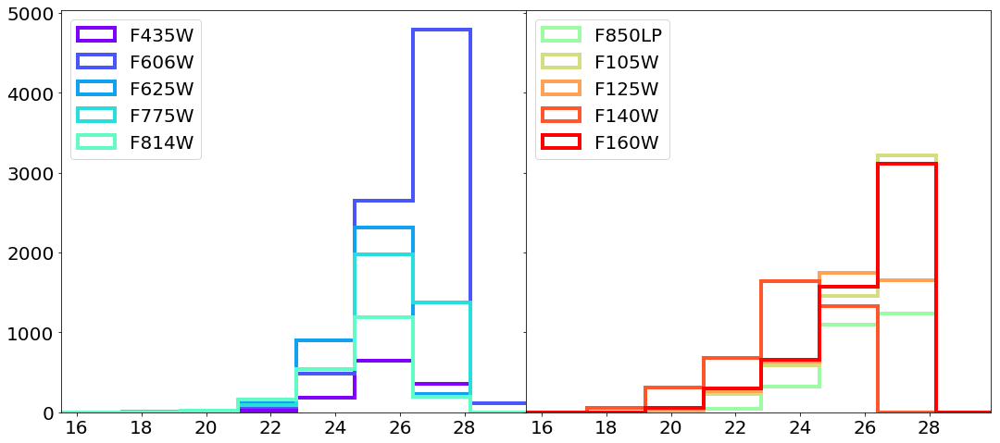

In [20]:
filters = ["F435W","F606W","F625W","F775W","F814W","F850LP","F105W","F125W","F140W","F160W"]
mpl.rcParams.update({'font.size': 20})

cmap = cm.rainbow #tab10 
colors = [cmap(i) for i in np.linspace(0,1,len(filters))]
lwidths = {f:4 for f in filters}
#lwidths["F105W"]=5
# mpl.figure(figsize=(10,10))
fig, ax = mpl.subplots(1,2,sharey="row",figsize=(18,8))
fig.subplots_adjust(wspace=0)
for i,filter in enumerate(filters):
    mags=[]
    color = colors[i]
    lw = lwidths[filter]
    catalog = ascii.read('/data1/rowland/LensedCatalogs/remaining_objects_{}.cat'.format(filter))
    catalog=catalog[np.where(catalog['ISOAREA_IMAGE']>=10)]

    mag = catalog['MAG_AUTO']
    for val in mag:
        if val == 99.0:
            continue
        else:
            val==val
        mags.append(val)
    print(np.max(mags),filter, np.shape(mags)) 
    
    
#     mpl.hist(mags,color=colors[i],bins=np.linspace(12,30,11),histtype='stepfilled',alpha=0.05)
    if i<5:
        ax[0].hist(mags,color=colors[i],bins=np.linspace(12,30,11),label=filter,histtype='step',linewidth=lw)
    else:
        ax[1].hist(mags,color=colors[i],bins=np.linspace(12,30,11),label=filter,histtype='step',linewidth=lw)
    #mpl.xlim(23.4,29)
for eixo in ax:
    eixo.legend(prop={'size': 20},loc=2)
    eixo.set_xlim(15.5,29.9)
fig.savefig('/data1/rowland/Figures/histogram_finalcatalog')

# segmentation map - all detections & dilated mask

In [4]:
# plt.figure(figsize=(10,10))
# plt.imshow(segmapTEST,vmin=0,vmax=.7)
# plt.savefig('/data1/rowland/Figures/segmapforpresentation')

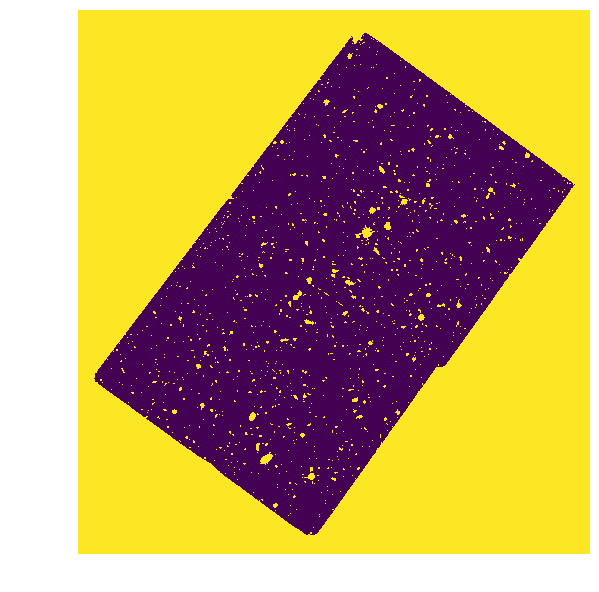

In [15]:
########################################
testfilter='F105W'
######################################
dilatedmask=pyfits.getdata('/data1/rowland/{}/dilated_mask_{}.fits'.format(testfilter,testfilter)) 

mpl.figure(figsize=(10,10))
mpl.imshow(dilatedmask,vmin=0,vmax=.7)
mpl.axis('off')
mpl.savefig('/data1/rowland/Figures/dilatedMASKforpresentation',overwrite=True)

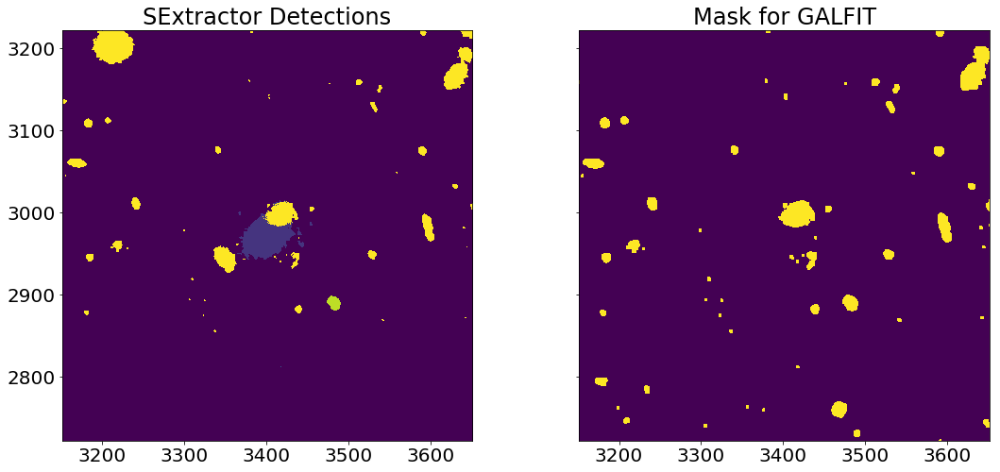

In [14]:

#shows how mask blocks all everything but the cluster galaxies



F105dilated_mask = pyfits.open('/run/media/rowland/PURPLEDRIVE/F105W/dilated_mask.fits')[0].data
segmapF105 = pyfits.open('/run/media/rowland/PURPLEDRIVE/segmaps_check/F105W_check.fits')[0].data

x = masterdata['X_IMAGE_F105'][35]#this indexing includes masked detections
y = masterdata['Y_IMAGE_F105'][35]#so index 35 is really detection 30




mpl.rcParams.update({'font.size': 20})

fig, axis = mpl.subplots(1,2,figsize=(18,8),sharex=True,sharey=True)
axis[0].imshow(segmapF105,vmin=1500,vmax=1540)#1506
axis[0].set_title('SExtractor Detections')
axis[1].imshow(F105dilated_mask,vmin=0,vmax=1)
axis[1].set_title('Mask for GALFIT')

for ax in axis:
    #ax.plot(xc, yc, "+",ms=20,mew=3) #plots last run detected object
    
    w = 250
    ax.set_xlim(x-w,x+w)
    ax.set_ylim(y-w,y+w)
#mpl.savefig('/data1/rowland/Figures/howmaskworks',overwrite=True)

0 (4824, 4538)


(0, 4600)

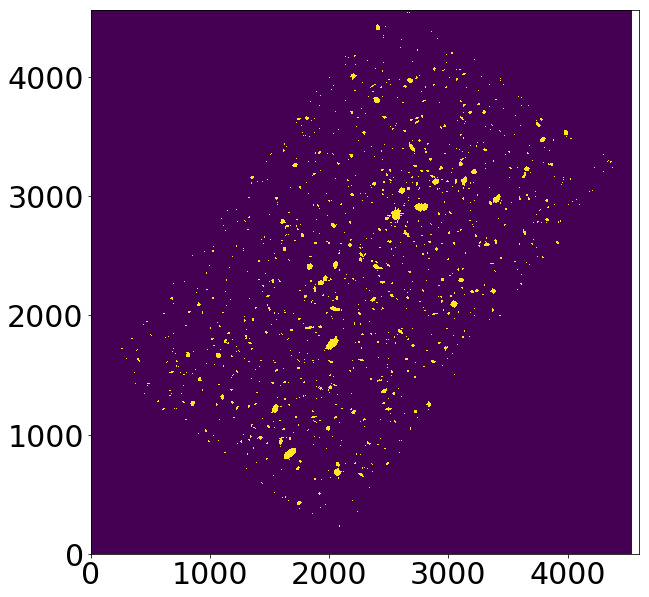

In [15]:
#all SEx detection

#segmapF105 = pyfits.open('/run/media/rowland/PURPLEDRIVE/segmaps_check/F105W_check.fits')[0].data
segmapF105 = pyfits.open('/data1/rowland/segmaps_check/F105W_check.fits')[0].data

mpl.figure(figsize=(10,10))
mpl.imshow(segmapF105,vmin=0,vmax=1)
print(np.max(segmapF105[0]),np.shape(segmapF105)) #shape is y,x
mpl.ylim(0,4560)
mpl.xlim(0,4600)
#mpl.savefig('/data1/rowland/Figures/allsegmapdetections_F105W')

# Footprints

/data1/rowland/all_fits_data/hst_14096_i2_wfc3_ir_f160w_drz.fits
/hst_14096_i2_wfc3_ir_f160w_drz


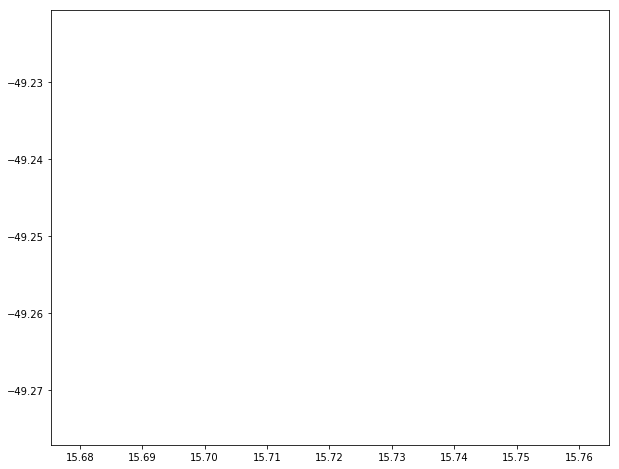

In [3]:
#input data

all_filter_files = glob.glob('/data1/rowland/all_fits_data/hst*_f*.fits') 
all_filter_coords = glob.glob('/home/rowland/leaps/coords/hst*.coo')

FIG, AX = mpl.subplots()

# for image in all_filter_files:
#     print(image)

#     imgname = image #"ElGordoTest_F160W.fits" # name of image to get footprint
#     img = pyfits.open(imgname)
#     imgHeader = img['SCI'].header
#     imgData = img['SCI'].data
#     #imgHeader = pyfits.getheader(imgname)
#     #imgData = pyfits.getdata(imgname)
#     #print(imgname, imgHeader, imgData) #its picking the first index [sci,wht,ctx,exp]
#     sky_coords = create_footprint(imgData,imgHeader,debug = False)
#     img.close()
#     print(type(sky_coords),np.shape(sky_coords),sky_coords)
#     fig,ax = mpl.subplots(figsize=(10,8))
#     for i in range(len(sky_coords)):
#         ax.plot(sky_coords[i][:,0],sky_coords[i][:,1],"-",color="SteelBlue",lw=3)
#         ax.set_title(imgname,fontsize=10)
#         AX.plot(sky_coords[i][:,0],sky_coords[i][:,1],"-")
#     break
#########################################################33
# def create_footprint(data,header, debug=False):
#  #data=originalfile2darray
#     imgMask = np.zeros_like(data)
#     smoothData = snd.gaussian_filter(data,sigma=2) # to smooth over artifacts
#     imgMask[smoothData!=0] = 1 # mask non-zero pixels
#     if debug is True:
#         fig,ax = mpl.subplots(figsize=(18,16))
#         ax.imshow(smoothData,vmin=0,vmax=0.5)
#         cntr = ax.contour(imgMask,levels=[0.5],zorder=10,colors="white")
#     else:
#         cntr = mpl.contour(imgMask,levels=[0.5]) # contour separating 0 and 1 pixels
#         mpl.close("all")
#     dataSegments = cntr.allsegs
    
#     #sky_coords_all = []
    
#     for i in range(len(dataSegments[0])):
#         polygon = dataSegments[0][i] # get contour pixel coordinates
#  #        wcs = pywcs.WCS(header)
# #        sky_coords = wcs.all_pix2world(polygon,1) # transform pixel to sky coordinates
# #         sky_coords_all.append(sky_coords)
#     #return sky_coords_all




# for image in all_filter_files:
#     print(image)

# #     imgname = image #"ElGordoTest_F160W.fits" # name of image to get footprint
# #     img = ascii.read(imgname)
# #     ra = img[::][1]
# #     dec = img[::][2]
#     imgname = image #"ElGordoTest_F160W.fits" # name of image to get footprint
#     img = pyfits.open(imgname)
#     imgHeader = img['SCI'].header
#     imgData = img['SCI'].data
#     imgHeader = pyfits.getheader(imgname)
#     imgData = pyfits.getdata(imgname)
#     #print(imgname, imgHeader, imgData) #its picking the first index [sci,wht,ctx,exp]
#     #sky_coords = create_footprint(imgData,imgHeader,debug = False)
#     something = create_footprint(imgData,imgHeader, debug = False)
#     print(imgname[28:-5])
#     sky_coords = ascii.read('/home/rowland/leaps/coords{}.coo'.format(imgname[28:-5]))
#     img.close()
#     #print(type(sky_coords),np.shape(sky_coords),sky_coords)
#     #print(np.shape(img))
#     fig,ax = mpl.subplots(figsize=(10,8))
#     for i in range(len(sky_coords)):
#         #print(i)
#         #print(img[i][1])
#         ax.plot(sky_coords[i][1],sky_coords[i][2],"-",color="SteelBlue",lw=3)
#         #ax.plot(ra,dec,"-",color="SteelBlue",lw=3)
#         #ax.set_title(imgname[27::],fontsize=10)
#         AX.plot(sky_coords[i][1],sky_coords[i][2],"-")
#         #AX.plot(ra,dec,"-")

#     break

In [13]:
def read_sky_coords(fname):

    fl = open(fname,"r")

    txt = fl.readlines()

    fl.close()

    sky_coords_all = []

    regions = []

    for line in txt:

        words = line.split()

        reg = int(words[0]) - 1

        if reg not in regions:

            sky_coords_all.append([])

            regions.append(reg)

        sky_coords_all[reg].append([float(c) for c in words[1:]])


    for reg in range(len(sky_coords_all)):

        sky_coords_all[reg] = np.asarray(sky_coords_all[reg])

    return sky_coords_all

#all_files = glob.glob("hst*fits")
#sky_coords_read = read_sky_coords(f"{file.split('.')[0]}.coo")

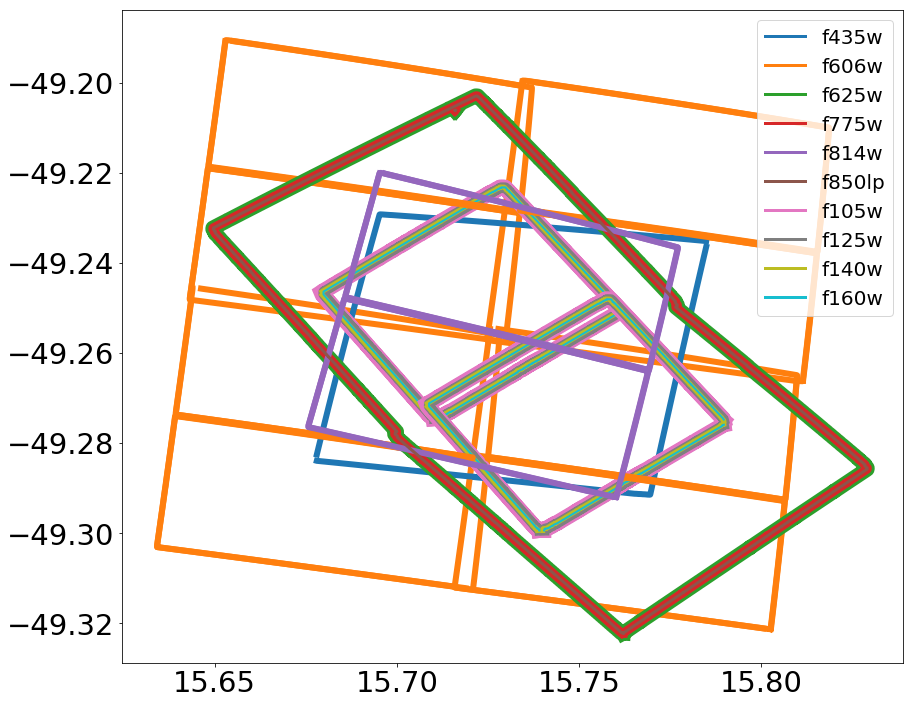

In [19]:
import matplotlib.cm as cm 
filters = ["f435w","f606w","f625w","f775w","f814w","f850lp","f105w","f125w","f140w","f160w"]

lstyles = {f:"-" for f in filters}
# lstyles["f125w"]="--"
# lstyles["f140w"]="-."
# lstyles["f160w"]=":"

lwidths = {f:6 for f in filters}
lwidths["f105w"]=15
lwidths["f125w"]=10
lwidths["f140w"]=5
lwidths["f160w"]=2
lwidths["f775w"]=9
lwidths["f625w"]=15
lwidths["f850lp"]=3

cmap = cm.tab10 
colors = [cmap(i) for i in np.linspace(0,1,len(filters))]

all_filter_coords = np.sort(glob.glob('/home/rowland/leaps/coords/hst*.coo'))
mpl.rcParams.update({'xtick.labelsize': 29,'ytick.labelsize': 29,'legend.fontsize':20})

fig,ax = mpl.subplots(figsize=(14,12))

for file in all_filter_coords:
    data = read_sky_coords(file)
    #print(file)
    for i,f in enumerate(filters):
        if f in file:
            color = colors[i]
            ls = lstyles[f]
            lw = lwidths[f]
#     print(len(data),np.shape(data))
#     ras=[]
#     decs=[]
#     for row in data:
#         ra = row[1]
#         dec = row[2]
#         ras.append(ra)
#         decs.append(dec)
    for i in range(len(data)):
        #print(i)
        #print(img[i][1])
        ras = data[i][:,0]
        decs = data[i][:,1]
        ax.plot(ras,decs,"-",color=color,lw=lw,ls=ls)
#     break#1

for i,f in enumerate(filters):
    ax.plot([],[],lw=3,c=colors[i],label=f)
ax.legend()
mpl.savefig('/data1/rowland/Figures/footprints')

In [19]:
#data[0][:,0]

array([15.70974225, 15.70974226, 15.70974226, ..., 15.67951284,
       15.6794937 , 15.67947456])

<class 'astropy.table.table.Table'> (8269,) col1        col2                col3       
---- ------------------ -------------------
   1  15.70974225203004 -49.274556996242396
   1 15.709742257281276  -49.27453199624789
   1 15.709742262532506 -49.274506996253365
   1 15.709742267783723  -49.27448199625885
   1 15.709742273034939  -49.27445699626432
   1 15.709742278286157  -49.27443199626977
   1 15.709742283537354  -49.27440699627523
   1 15.709742288788561  -49.27438199628064
   1 15.709723132492666  -49.27436949456809
   1 15.709684814649696 -49.274369491128034
 ...                ...                 ...
   3 15.760531829005261  -49.25005040957582
   3 15.760550988722885  -49.25006290288994
   3 15.760570148450197 -49.250075396200884
   3 15.760570168939767  -49.25010039619463
   3 15.760589328686484  -49.25011288950242
   3 15.760627627690322 -49.250112876114706
   3 15.760665926694069  -49.25011286271435
   3 15.760704225697804  -49.25011284930134
   3 15.760742524701511  -49.250

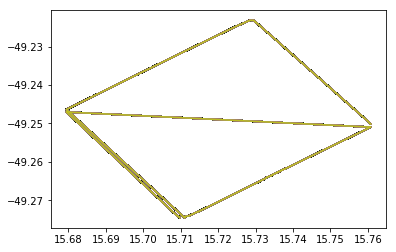

In [13]:
# all_filter_coords = glob.glob('/home/rowland/leaps/coords/hst*.coo')

# FIG, AX = mpl.subplots()
# for fn in all_filter_coords:
#     sky_coords = ascii.read(fn)
#     print(type(sky_coords),np.shape(sky_coords),sky_coords)
#     for i in range(len(sky_coords)):
#         ax.plot(sky_coords['col2'],sky_coords['col3'],"-",color="SteelBlue",lw=3)
#         ax.set_title(imgname,fontsize=10)
#         AX.plot(sky_coords['col2'],sky_coords['col3'],"-")
#     break

# Subtracted Elgordos

In [ ]:
#to plot one at a time and tweek vmin/vmax

filters = ['F105W','F125W','F140W','F160W','F435W','F606W','F625W','F775W','F814W','F850LP'] #['F435W'] #

f, axes = mpl.subplots(len(filters),2,sharey=True,figsize=(35,35))

for i,filter in enumerate(filters):
    originalimage = pyfits.getdata('/data1/rowland/elgordo_{}.fits'.format(filter))
    backgrounds = pyfits.getdata('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))#.data
    mpl.rcParams.update({'font.size': 25})
    axes[i,0].imshow(originalimage,vmin=0,vmax=0.02) #elgordo
    axes[i,0].title.set_text('Original Image {}'.format(filter))
    axes[i,1].imshow(backgrounds,vmin=0,vmax=0.02)#residuals
    axes[i,1].title.set_text('Subtracted Image {}'.format(filter))

f.savefig('/data1/rowland/Figures/threefigs_ALLfilters',overwrite=True)

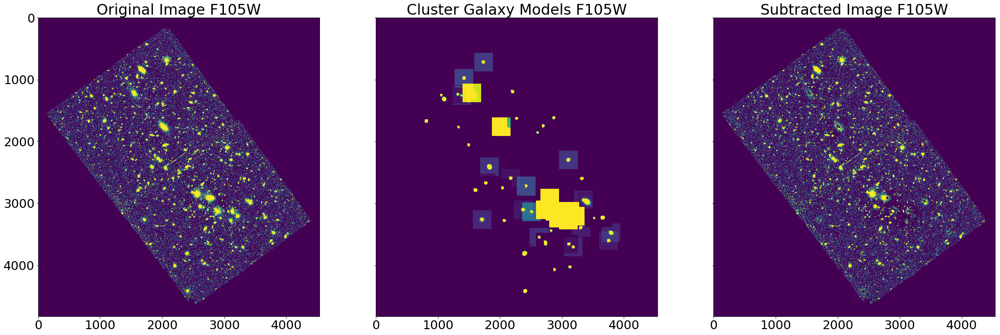

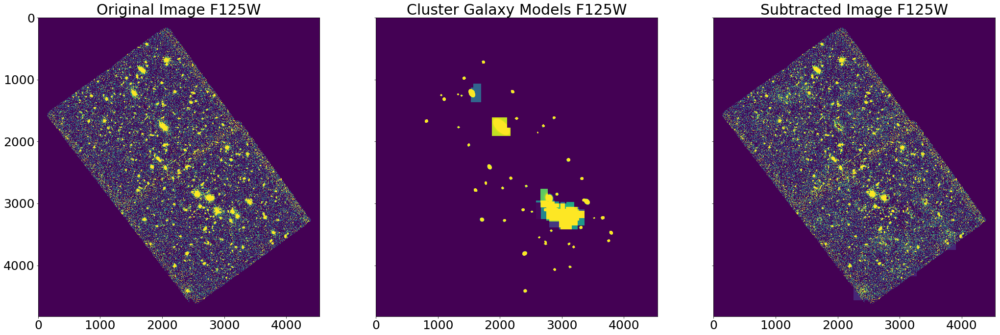

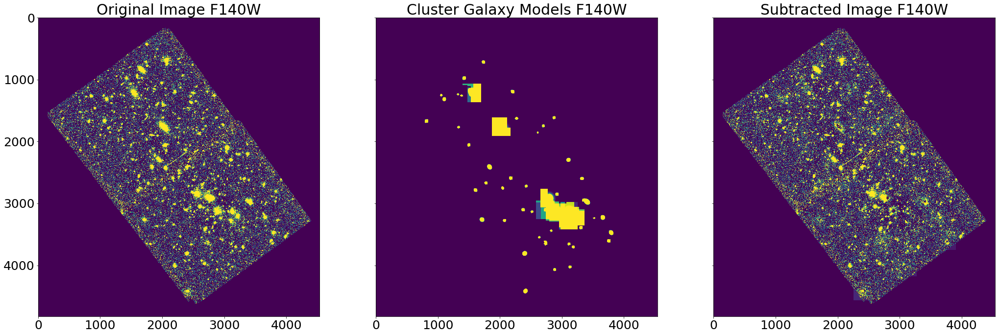

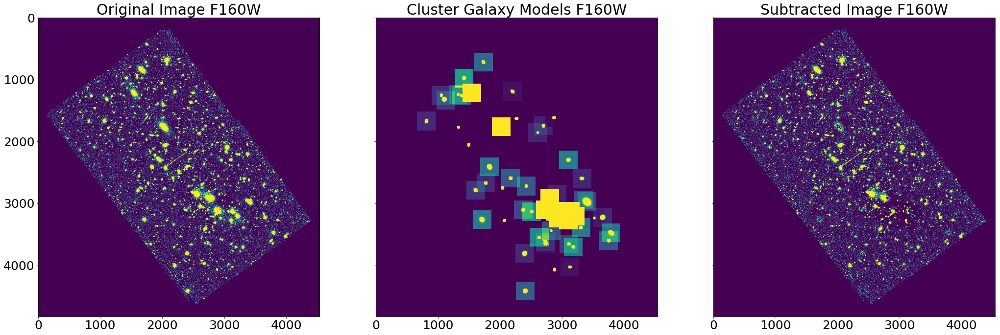

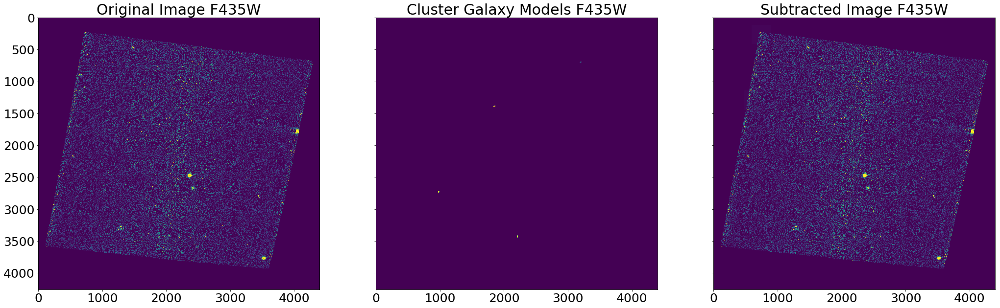

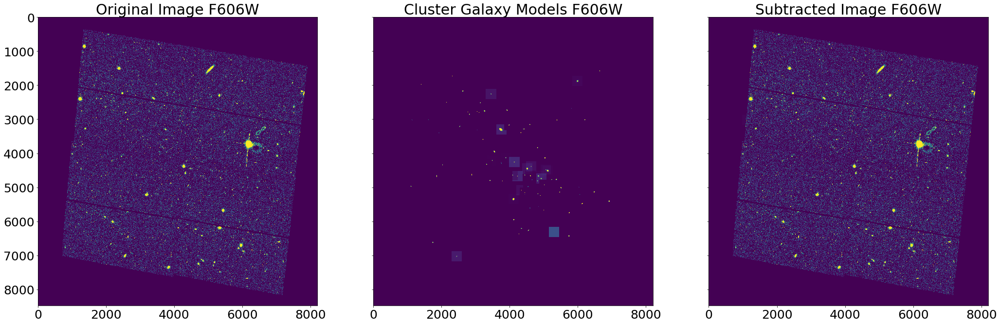

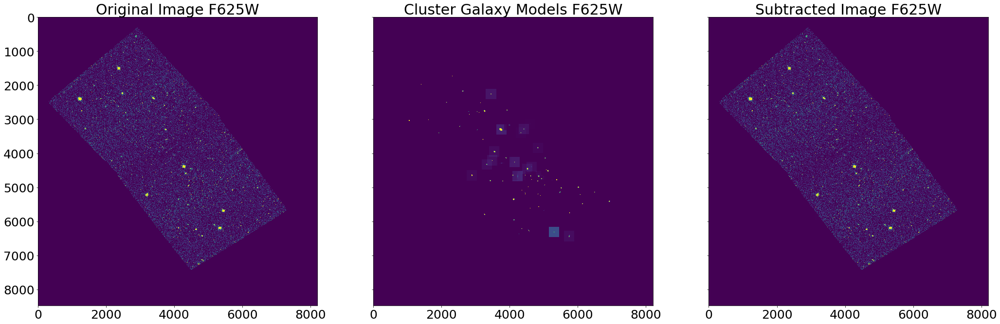

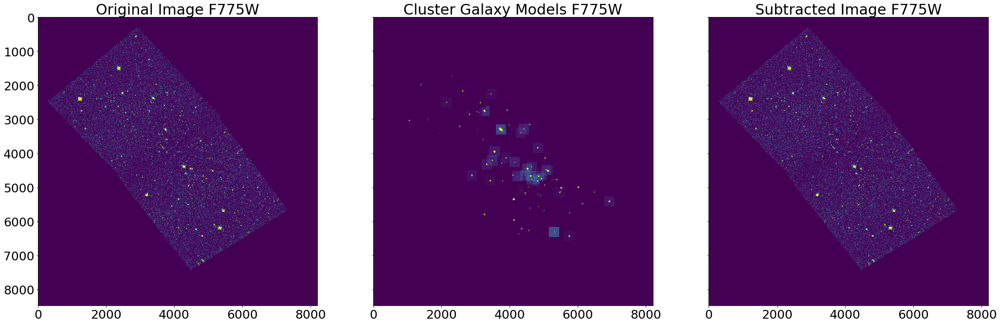

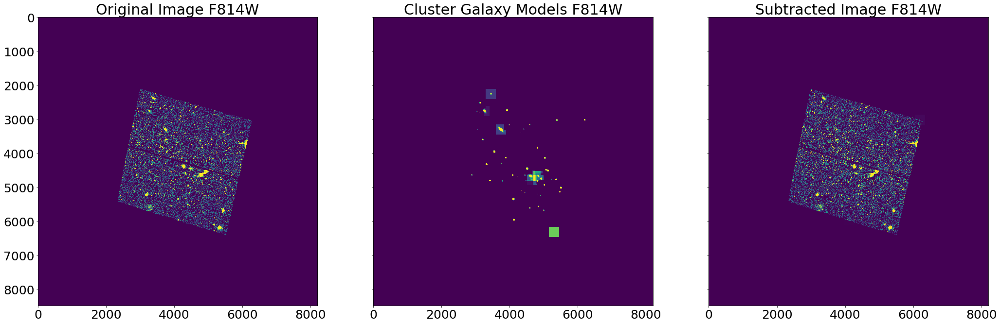

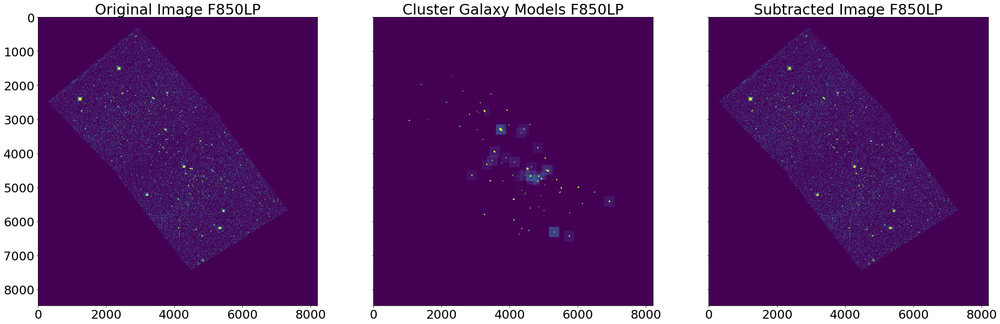

In [2]:
#to plot one at a time and tweek vmin/vmax

filters = ['F105W','F125W','F140W','F160W','F435W','F606W','F625W','F775W','F814W','F850LP'] #['F435W'] #


for filter in filters:
    originalimage = pyfits.getdata('/data1/rowland/elgordo_{}.fits'.format(filter))
    emptyfield = pyfits.getdata('/data1/rowland/models_elgordo{}'.format(filter))#.data
    backgrounds = pyfits.getdata('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))#.data
    mpl.rcParams.update({'font.size': 25})
    f, (ax1,ax2,ax3) = mpl.subplots(1,3,sharey=True,figsize=(35,35))
    ax1.imshow(originalimage,vmin=0,vmax=0.02) #elgordo
    ax1.title.set_text('Original Image {}'.format(filter),)
    ax2.imshow(emptyfield,vmin=0,vmax=0.002)#subtracted galaxies
    ax2.title.set_text('Cluster Galaxy Models {}'.format(filter))
    ax3.imshow(backgrounds,vmin=0,vmax=0.02)#residuals
    ax3.title.set_text('Subtracted Image {}'.format(filter))
    mpl.savefig('/data1/rowland/Figures/threefigs_{}'.format(filter),overwrite=True)
    #f.savefig('/data1/rowland/Figures/threefigs_ALLfilters',overwrite=True)

4397 4256 F435W


IndexError: too many indices for array

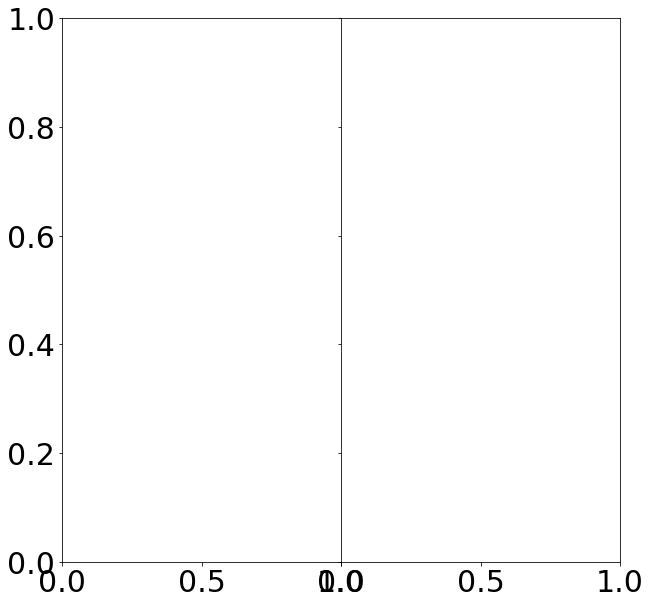

In [6]:


#NEEDTORUNTHIS
#to save all plotted at once, before/after

#filters = ['F105W','F125W','F140W','F160W']#,'F435W']#,'F606W','F625W','F775W','F814W','F850LP']  #1st half
#filters = ['F625W','F775W','F850LP'] #2nd half
#filters = ['F814W','F606W'] #last ones b/c funny shape
filters = ['F435W']#,'F814W'] #really last
mpl.rcParams.update({'font.size': 30})

#f, axes = mpl.subplots(len(filters),2,sharey=True,figsize=(10,21)) # (width,length) 1st half use vmax =0.2
#f, axes = mpl.subplots(len(filters),2,sharey=True,figsize=(10,18)) #2nd half use vmac = .02
#f, axes = mpl.subplots(len(filters),2,sharey=True,figsize=(10,10)) # last ones .07
#f, axes = mpl.subplots(len(filters),2,sharey=True,figsize=(10,10)) # really last  
f, axes = mpl.subplots(1,2,sharey=True,figsize=(10,10)) # really last  


f.subplots_adjust(wspace=0,hspace=0)
for i,filter in enumerate(filters):
    originalimage = pyfits.getdata('/data1/rowland/elgordo_{}.fits'.format(filter))
    M,N = originalimage.shape 
    xx,yy = np.mgrid[:M,:N] #[:N,:M]
    xmin = np.amin(xx[originalimage!=0])
    xmax = np.amax(xx[originalimage!=0])
    ymin = np.amin(yy[originalimage!=0])
    ymax = np.amax(yy[originalimage!=0])
    print(N,M,filter)

    backgrounds = pyfits.getdata('/data1/rowland/FINALimages/galstarsky_subtracted/modelsWOskyNstar_subtubtracted_elgordo{}.fits'.format(filter))#.data
    mpl.rcParams.update({'font.size': 25})
    axes[i,0].imshow(np.ma.masked_where(originalimage==0,originalimage),vmin=0,vmax=0.02,cmap='inferno') #vmax=0.02) #elgordo
    #axes[i,0].title.set_text('Original Image {}'.format(filter))
    axes[i,1].imshow(np.ma.masked_where(originalimage==0,backgrounds),vmin=0,vmax=0.02,cmap='inferno')#vmax=0.02)#residuals
    #axes[i,1].title.set_text('Subtracted Image {}'.format(filter))
    for eixo in axes[i,:]:
#         eixo.set_xlim(xmin,xmax)
#         eixo.set_ylim(ymin,ymax)
        eixo.set_ylim(xmin,xmax)
        eixo.set_xlim(ymin,ymax)
        eixo.axis("off")
        #f.tight_layout()
#f.savefig('/data1/rowland/Figures/threefigs_ALLfilters_1sthalf',overwrite=True,transparent=True) #1st half
#f.savefig('/data1/rowland/Figures/threefigs_ALLfilters',overwrite=True) #all
#f.savefig('/data1/rowland/Figures/threefigs_ALLfilters_2ndhalf',overwrite=True,transparent=True) # 2nd half
#f.savefig('/data1/rowland/Figures/threefigs_ALLfilters_lastones',overwrite=True,transparent=True) # last one bc funny shape
f.savefig('/data1/rowland/Figures/threefigs_ALLfilters_reallylast',overwrite=True,transparent=True) # really last one 



4397 4256 F435W


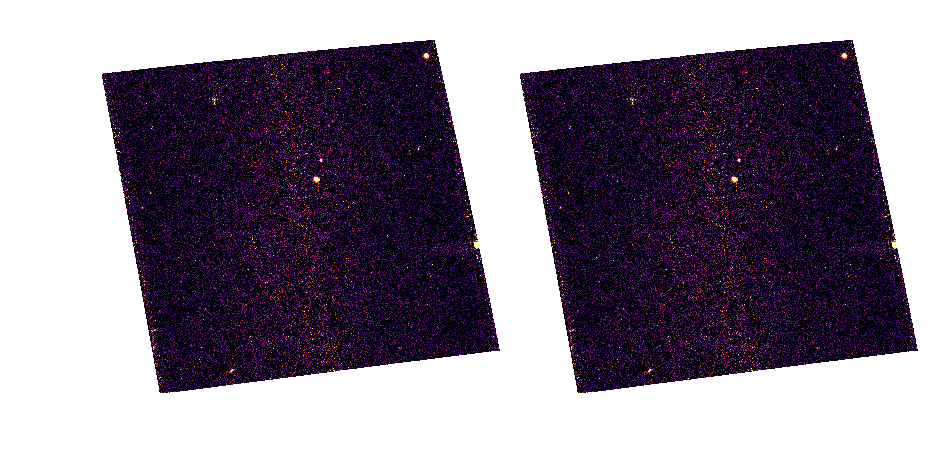

In [9]:


filters = ['F435W']#,'F814W'] #really last
mpl.rcParams.update({'font.size': 30})

  
f, axes = mpl.subplots(1,2,sharey=True,figsize=(15,10)) # really last  


f.subplots_adjust(wspace=0,hspace=0)
for i,filter in enumerate(filters):
    originalimage = pyfits.getdata('/data1/rowland/elgordo_{}.fits'.format(filter))
    M,N = originalimage.shape 
    xx,yy = np.mgrid[:M,:N] #[:N,:M]
    xmin = np.amin(xx[originalimage!=0])
    xmax = np.amax(xx[originalimage!=0])
    ymin = np.amin(yy[originalimage!=0])
    ymax = np.amax(yy[originalimage!=0])
    print(N,M,filter)

    backgrounds = pyfits.getdata('/data1/rowland/FINALimages/galstarsky_subtracted/modelsWOskyNstar_subtubtracted_elgordo{}.fits'.format(filter))#.data
    mpl.rcParams.update({'font.size': 25})
    axes[0].imshow(np.ma.masked_where(originalimage==0,originalimage),vmin=0,vmax=0.02,cmap='inferno') #vmax=0.02) #elgordo
    axes[1].imshow(np.ma.masked_where(originalimage==0,backgrounds),vmin=0,vmax=0.02,cmap='inferno')#vmax=0.02)#residuals
    axes[0].axis('off')
    axes[1].axis('off')

    #     for eixo in axes[i,:]:
#         eixo.set_ylim(xmin,xmax)
#         eixo.set_xlim(ymin,ymax)
#         eixo.axis("off")
f.savefig('/data1/rowland/Figures/threefigs_ALLfilters_reallylast',overwrite=True,transparent=True) # really last one 


In [20]:
#takes soo long to run...just do indiviually above, its way faster

#doing first half of filters so runs faster


# filters = ['F105W','F125W','F140W','F160W','F435W'] #,'F606W','F625W','F775W','F814W','F850LP']

# for filter in filters:
#     originalimage = get_pkg_data_filename('/data1/rowland/elgordo_{}.fits'.format(filter))
#     original_image_data = pyfits.getdata(originalimage)
#     emptyfield = get_pkg_data_filename('/data1/rowland/models_elgordo{}'.format(filter))
#     emptyfields = pyfits.getdata(emptyfield)
#     backgrounds = get_pkg_data_filename('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))
#     background = pyfits.getdata(backgrounds)
#     f, (ax1,ax2,ax3) = mpl.subplots(1,3,sharey=True,figsize=(35,35))
#     ax1.imshow(original_image_data,vmin=0,vmax=0.2) #elgordo
#     ax1.title.set_text('Original Image')
#     ax2.imshow(emptyfields,vmin=0,vmax=0.2)#subtracted galaxies
#     ax2.title.set_text('Cluster Galaxy Models')
#     ax3.imshow(background,vmin=0,vmax=0.2)#residuals
#     ax3.title.set_text('Subtracted Image')

# INDIVIDUAL plots per filter

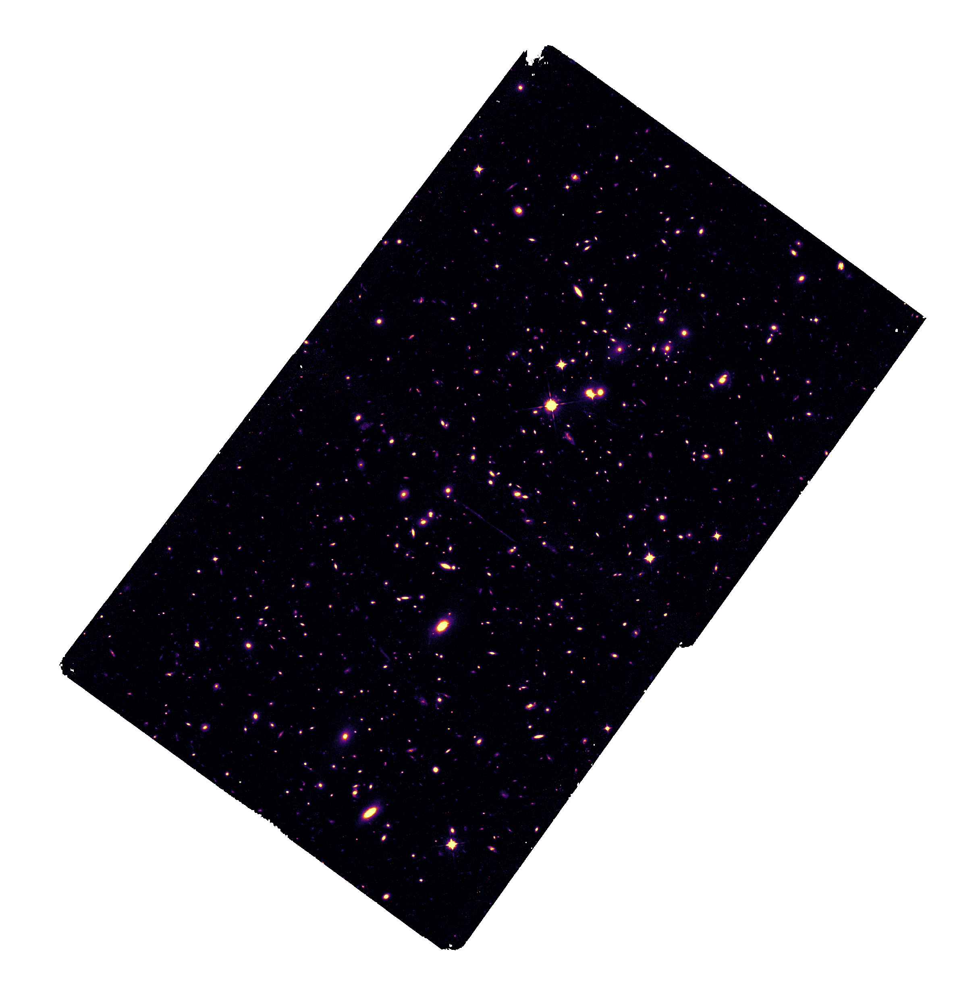

In [53]:


filters = ['F105W']#,'F125W','F140W','F160W','F435W','F606W','F625W','F775W','F814W','F850LP']

mpl.rcParams.update({'font.size': 25})

for filter in filters:
    originalimage = get_pkg_data_filename('/data1/rowland/elgordo_{}.fits'.format(filter))
    original_image_data = pyfits.getdata(originalimage)
    
    #emptyfields = get_pkg_data_filename('/data1/rowland/FINALimages/models/modelsWOsky_elgordo{}'.format(filter))
    emptyfields = get_pkg_data_filename('/data1/rowland/FINALimages/galsky_subtracted/modelsWOsky_subtubtracted_elgordo{}.fits'.format(filter))
    emptyfield = pyfits.getdata(emptyfields)
    
    backgrounds = get_pkg_data_filename('/data1/rowland/FINALimages/galstarsky_subtracted/modelsWOskyNstar_subtubtracted_elgordo{}.fits'.format(filter))
    background = pyfits.getdata(backgrounds)
    #f, (ax1,ax2,ax3) = mpl.subplots(1,3,sharey=True,figsize=(35,35))
    f, ax1 = mpl.subplots(1,1,sharey=True,figsize=(35,35))

    ax1.imshow(np.ma.masked_where(original_image_data==0,original_image_data),vmin=0,vmax=0.2,cmap='inferno') #elgordo
    #ax1.title.set_text('Original Image {}'.format(filter))
    ##ax1.set_title('Original Image {}'.format(filter),fontsize=30)

    #ax2.imshow(np.ma.masked_where(original_image_data==0,emptyfield),vmin=0,vmax=.2,cmap='inferno')#subtracted galaxies
    #ax2.imshow(emptyfield,vmin=0,vmax=.05)#subtracted galaxies
    #ax2.title.set_text('Cluster Galaxy Models')
    #ax2.set_title('Cluster Galaxy Models',fontsize=30)
    ##ax2.set_title('Subtracted galaxy models from image')

    #ax3.imshow(np.ma.masked_where(original_image_data==0,background),vmin=0,vmax=.2,cmap='inferno')#residuals
    ##ax3.set_title('Subtracted Galaxy Models & Stars Image {}'.format(filter),fontsize=30)
    
    
ax1.axis("off")
##ax3.axis("off")
##ax2.axis("off")
f.tight_layout()
#mpl.savefig('/data1/rowland/Figures/beforeNafterWmodel_{}'.format(filter),transparent=True)
mpl.savefig('/data1/rowland/Figures/original_image1_{}'.format(filter),transparent=True) #1
#mpl.savefig('/data1/rowland/Figures/skysubtmodels_subtracted_images2_{}'.format(filter),transparent=True) #2
#mpl.savefig('/data1/rowland/Figures/skysubtmodelsNstar_subtracted_image3_{}'.format(filter),transparent=True) #3
#mpl.savefig('/data1/rowland/Figures/galaxymodelsWOsky_{}'.format(filter),transparent=True) #2


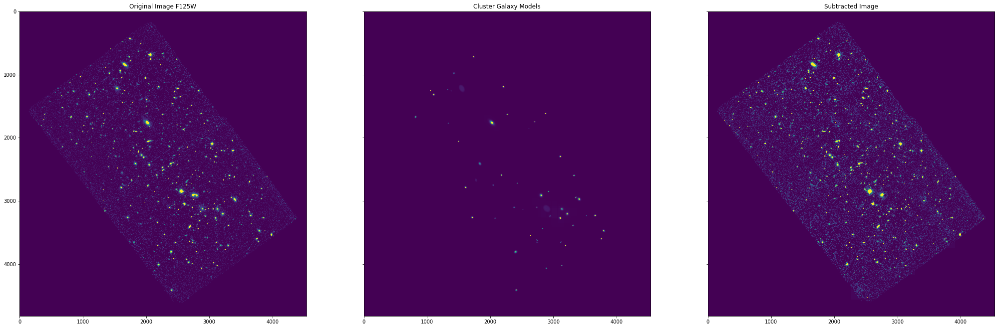

In [15]:
filters = ['F125W']#,'F140W','F160W','F435W','F606W','F625W','F775W','F814W','F850LP']
for filter in filters:
    originalimage = get_pkg_data_filename('/data1/rowland/elgordo_{}.fits'.format(filter))
    original_image_data = pyfits.getdata(originalimage)
    emptyfield = get_pkg_data_filename('/data1/rowland/models_elgordo{}'.format(filter))
    emptyfields = pyfits.getdata(emptyfield)
    backgrounds = get_pkg_data_filename('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))
    background = pyfits.getdata(backgrounds)
    f, (ax1,ax2,ax3) = mpl.subplots(1,3,sharey=True,figsize=(35,35))
    ax1.imshow(original_image_data,vmin=0,vmax=0.2) #elgordo
    ax1.title.set_text('Original Image {}'.format(filter))
    ax2.imshow(emptyfields,vmin=0,vmax=.5)#subtracted galaxies
    ax2.title.set_text('Cluster Galaxy Models')
    ax3.imshow(background,vmin=0,vmax=0.12)#residuals
    ax3.title.set_text('Subtracted Image')

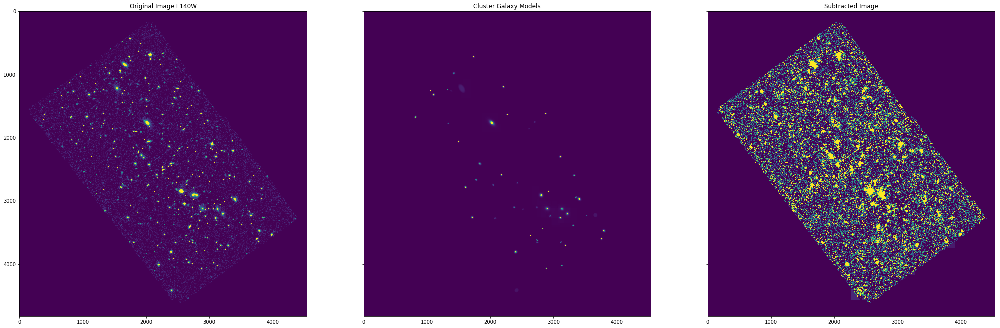

In [17]:
filters = ['F140W']#,'F160W','F435W','F606W','F625W','F775W','F814W','F850LP']
for filter in filters:
    originalimage = get_pkg_data_filename('/data1/rowland/elgordo_{}.fits'.format(filter))
    original_image_data = pyfits.getdata(originalimage)
    emptyfield = get_pkg_data_filename('/data1/rowland/models_elgordo{}'.format(filter))
    emptyfields = pyfits.getdata(emptyfield)
    backgrounds = get_pkg_data_filename('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))
    background = pyfits.getdata(backgrounds)
    f, (ax1,ax2,ax3) = mpl.subplots(1,3,sharey=True,figsize=(35,35))
    ax1.imshow(original_image_data,vmin=0,vmax=0.2) #elgordo
    ax1.title.set_text('Original Image {}'.format(filter))
    ax2.imshow(emptyfields,vmin=0,vmax=.5)#subtracted galaxies
    ax2.title.set_text('Cluster Galaxy Models')
    ax3.imshow(background,vmin=0,vmax=.02)#residuals
    ax3.title.set_text('Subtracted Image')

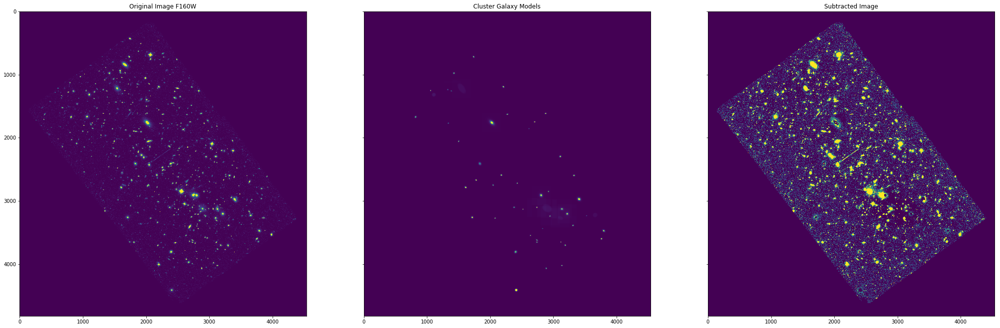

In [18]:
filters = ['F160W']#,'F435W','F606W','F625W','F775W','F814W','F850LP']
for filter in filters:
    originalimage = get_pkg_data_filename('/data1/rowland/elgordo_{}.fits'.format(filter))
    original_image_data = pyfits.getdata(originalimage)
    emptyfield = get_pkg_data_filename('/data1/rowland/models_elgordo{}'.format(filter))
    emptyfields = pyfits.getdata(emptyfield)
    backgrounds = get_pkg_data_filename('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))
    background = pyfits.getdata(backgrounds)
    f, (ax1,ax2,ax3) = mpl.subplots(1,3,sharey=True,figsize=(35,35))
    ax1.imshow(original_image_data,vmin=0,vmax=0.2) #elgordo
    ax1.title.set_text('Original Image {}'.format(filter))
    ax2.imshow(emptyfields,vmin=0,vmax=.5)#subtracted galaxies
    ax2.title.set_text('Cluster Galaxy Models')
    ax3.imshow(background,vmin=0,vmax=.02)#residuals
    ax3.title.set_text('Subtracted Image')

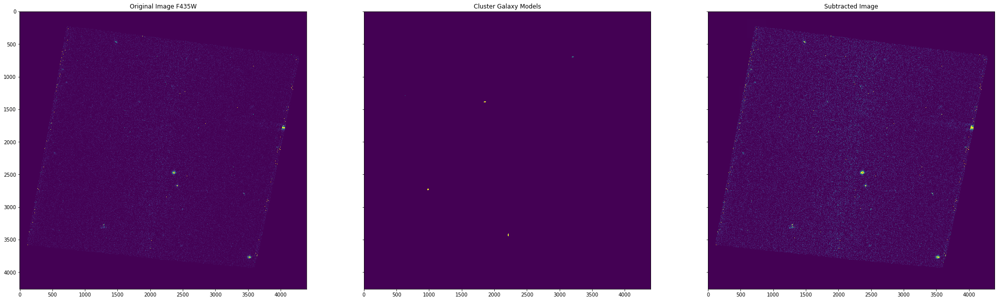

In [18]:
filters = ['F435W']#,'F606W','F625W','F775W','F814W','F850LP']
for filter in filters:
    originalimage = get_pkg_data_filename('/data1/rowland/elgordo_{}.fits'.format(filter))
    original_image_data = pyfits.getdata(originalimage)
    emptyfield = get_pkg_data_filename('/data1/rowland/models_elgordo{}'.format(filter))
    emptyfields = pyfits.getdata(emptyfield)
    backgrounds = get_pkg_data_filename('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))
    background = pyfits.getdata(backgrounds)
    f, (ax1,ax2,ax3) = mpl.subplots(1,3,sharey=True,figsize=(35,35))
    ax1.imshow(original_image_data,vmin=0,vmax=0.1) #elgordo
    ax1.title.set_text('Original Image {}'.format(filter))
    ax2.imshow(emptyfields,vmin=0,vmax=.0015)#subtracted galaxies
    ax2.title.set_text('Cluster Galaxy Models')
    ax3.imshow(background,vmin=0,vmax=.05)#residuals
    ax3.title.set_text('Subtracted Image')

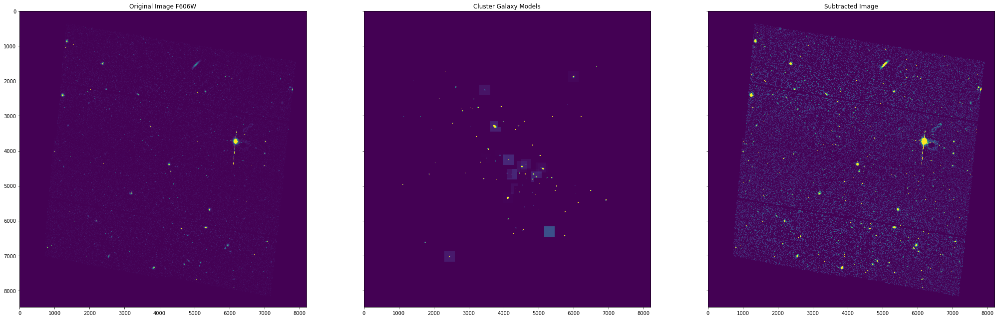

In [15]:
filters = ['F606W']#,'F625W','F775W','F814W','F850LP']
for filter in filters:
    originalimage = get_pkg_data_filename('/data1/rowland/elgordo_{}.fits'.format(filter))
    original_image_data = pyfits.getdata(originalimage)
    emptyfield = get_pkg_data_filename('/data1/rowland/models_elgordo{}'.format(filter))
    emptyfields = pyfits.getdata(emptyfield)
    backgrounds = get_pkg_data_filename('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))
    background = pyfits.getdata(backgrounds)
    f, (ax1,ax2,ax3) = mpl.subplots(1,3,sharey=True,figsize=(35,35))
    ax1.imshow(original_image_data,vmin=0,vmax=0.2) #elgordo
    ax1.title.set_text('Original Image {}'.format(filter))
    ax2.imshow(emptyfields,vmin=0,vmax=.002)#subtracted galaxies
    ax2.title.set_text('Cluster Galaxy Models')
    ax3.imshow(background,vmin=0,vmax=.04)#residuals
    ax3.title.set_text('Subtracted Image')

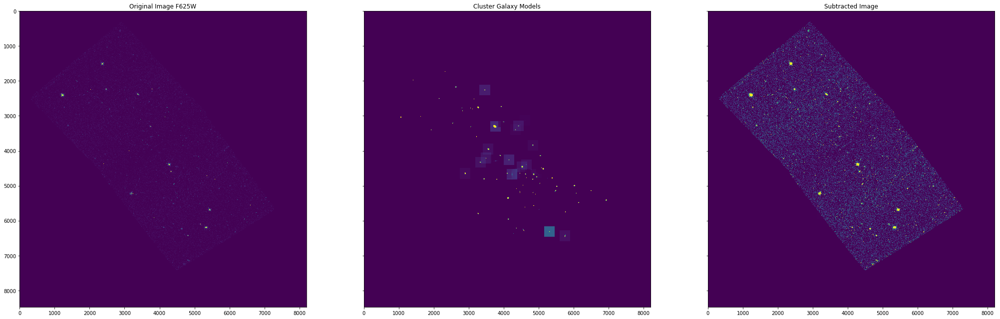

In [5]:
filters = ['F625W']#,'F775W','F814W','F850LP']
for filter in filters:
    originalimage = get_pkg_data_filename('/data1/rowland/elgordo_{}.fits'.format(filter))
    original_image_data = pyfits.getdata(originalimage)
    emptyfield = get_pkg_data_filename('/data1/rowland/models_elgordo{}'.format(filter))
    emptyfields = pyfits.getdata(emptyfield)
    backgrounds = get_pkg_data_filename('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))
    background = pyfits.getdata(backgrounds)
    f, (ax1,ax2,ax3) = mpl.subplots(1,3,sharey=True,figsize=(35,35))
    ax1.imshow(original_image_data,vmin=0,vmax=0.15) #elgordo
    ax1.title.set_text('Original Image {}'.format(filter))
    ax2.imshow(emptyfields,vmin=0,vmax=.0015)#subtracted galaxies
    ax2.title.set_text('Cluster Galaxy Models')
    ax3.imshow(background,vmin=0,vmax=0.02)#residuals
    ax3.title.set_text('Subtracted Image')
    

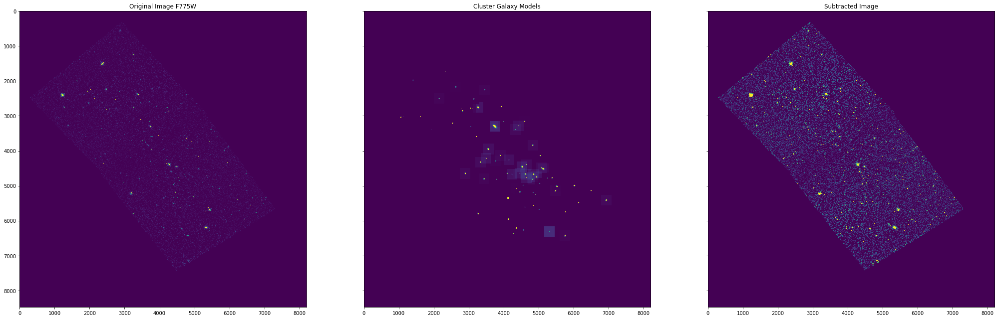

In [12]:
filters = ['F775W']#,'F814W','F850LP']
for filter in filters:
    originalimage = get_pkg_data_filename('/data1/rowland/elgordo_{}.fits'.format(filter))
    original_image_data = pyfits.getdata(originalimage)
    emptyfield = get_pkg_data_filename('/data1/rowland/models_elgordo{}'.format(filter))
    emptyfields = pyfits.getdata(emptyfield)
    backgrounds = get_pkg_data_filename('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))
    background = pyfits.getdata(backgrounds)
    f, (ax1,ax2,ax3) = mpl.subplots(1,3,sharey=True,figsize=(35,35))
    ax1.imshow(original_image_data,vmin=0,vmax=0.1) #elgordo
    ax1.title.set_text('Original Image {}'.format(filter))
    ax2.imshow(emptyfields,vmin=0,vmax=.004)#subtracted galaxies
    ax2.title.set_text('Cluster Galaxy Models')
    ax3.imshow(background,vmin=0,vmax=.02)#residuals
    ax3.title.set_text('Subtracted Image')

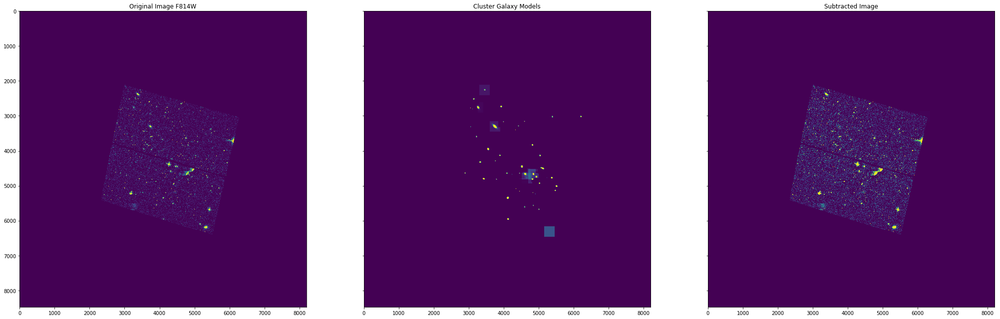

In [13]:
filters = ['F814W']#,'F850LP']
for filter in filters:
    originalimage = get_pkg_data_filename('/data1/rowland/elgordo_{}.fits'.format(filter))
    original_image_data = pyfits.getdata(originalimage)
    emptyfield = get_pkg_data_filename('/data1/rowland/models_elgordo{}'.format(filter))
    emptyfields = pyfits.getdata(emptyfield)
    backgrounds = get_pkg_data_filename('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))
    background = pyfits.getdata(backgrounds)
    f, (ax1,ax2,ax3) = mpl.subplots(1,3,sharey=True,figsize=(35,35))
    ax1.imshow(original_image_data,vmin=0,vmax=0.08) #elgordo
    ax1.title.set_text('Original Image {}'.format(filter))
    ax2.imshow(emptyfields,vmin=0,vmax=.006)#subtracted galaxies
    ax2.title.set_text('Cluster Galaxy Models')
    ax3.imshow(background,vmin=0,vmax=.04)#residuals
    ax3.title.set_text('Subtracted Image')

# Showing a single subtraction

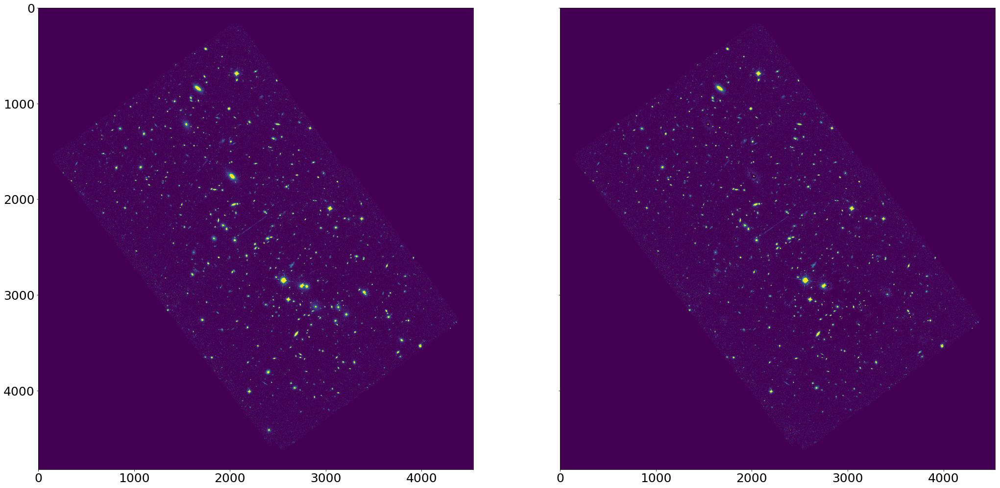

In [13]:
filters = ['F105W']
for filter in filters:
    originalimage = get_pkg_data_filename('/data1/rowland/elgordo_{}.fits'.format(filter))
    original_image_data = pyfits.getdata(originalimage)
    emptyfield = get_pkg_data_filename('/data1/rowland/models_elgordo{}'.format(filter))
    emptyfields = pyfits.getdata(emptyfield)
    backgrounds = get_pkg_data_filename('/data1/rowland/subtracted_elgordo{}.fits'.format(filter))
    background = pyfits.getdata(backgrounds)
    mpl.rcParams.update({'font.size': 25})

    f, (ax1,ax2) = mpl.subplots(1,2,sharey=True,figsize=(35,35))
    ax1.imshow(original_image_data,vmin=0,vmax=0.2) #elgordo
    #ax1.title.set_text('Original')
    #ax2.imshow(emptyfields[filter],vmin=0,vmax=0.2)#subtracted galaxies
    #ax2.imshow(np.flip(emptyfields[filter],axis=1),vmin=0,vmax=0.2)
    #ax2.title.set_text('Second image/ FitModels')
    ax2.imshow(background,vmin=0,vmax=0.2)#residuals
#     ax2.title.set_text('Subtracted data')

#     ax1.set_ylim(2500,3500)
#     ax2.set_ylim(2500,3500)
#     ax1.set_xlim(2500,3500)
#     ax2.set_xlim(2500,3500)
    #mpl.savefig('/data1/rowland/Figures/imperfect_subtractionsEX',overwrite=True)
    #mpl.savefig('/data1/rowland/Figures/beforeAfterEX',overwrite=True)

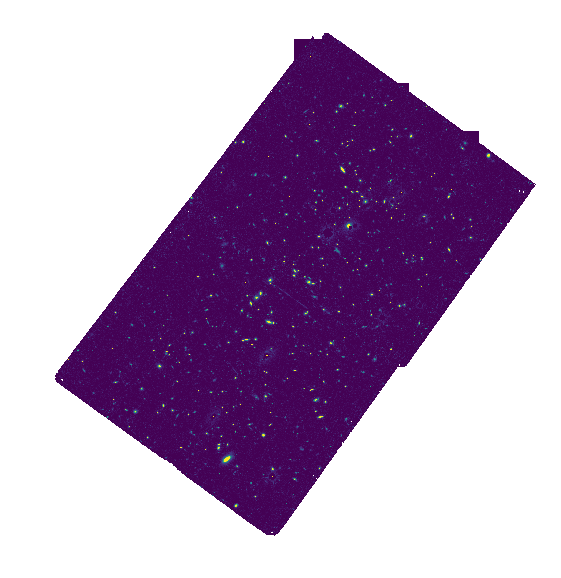

In [62]:
#includes STAR Mask



testfilter = 'F105W' 
B1 = .5 
B2 = 2

SE_tableTEST = ascii.read('/data1/rowland/testPSF_{}.cat'.format(testfilter))
SE_TESTshort1=SE_tableTEST[np.where(SE_tableTEST["MU_MAX"] < (SE_tableTEST["MAG_AUTO"]-B1))]
SE_TESTshort2=SE_TESTshort1[np.where(SE_TESTshort1["MU_MAX"] > (SE_TESTshort1["MAG_AUTO"]-B2))]
SE_TESTshort = SE_TESTshort2[np.where(SE_TESTshort2['MAG_AUTO']<20)]

collected_regions = []
index_list = []
segmapoutputTEST, starmaskTEST = create_mask(testfilter,SE_TESTshort)

elgordoTEST = pyfits.open('/run/media/rowland/PURPLEDRIVE/elgordo_{}.fits'.format(testfilter))[0].data
modelmaskTEST = pyfits.getdata('/data1/rowland/FINALimages/models/modelsWOsky_elgordo{}'.format(testfilter))#.data
modelsandstarsTEST = starmaskTEST + modelmaskTEST
subtractedelgordoTEST = elgordoTEST - modelsandstarsTEST

mpl.figure(figsize=(10,10))
#mpl.imshow(subtractedelgordoTEST,vmin=0,vmax=0.2)
mpl.imshow(np.ma.masked_where(subtractedelgordoTEST==0,subtractedelgordoTEST),vmin=0,vmax=0.2)


mpl.axis('off')
mpl.savefig('/data1/rowland/Figures/modelsWOsky_star_subtracted_elgordo{}'.format(testfilter),overwrite=True,transparent=True)
#mpl.savefig('/data1/rowland/Figures/modelsandstarssubt_elgordo{}'.format(testfilter),overwrite =True)

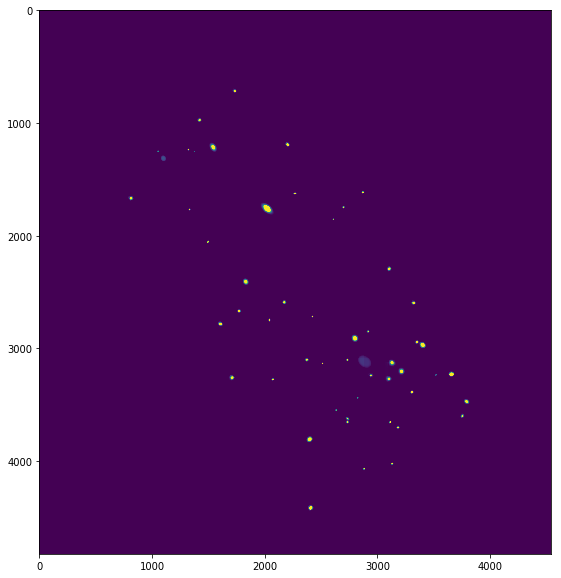

In [8]:
#single filter model cluster

filters = ['F105W']


for filter in filters:
    emptyfield = get_pkg_data_filename('/data1/rowland/models_elgordo{}'.format(filter))
    emptyfields = pyfits.getdata(emptyfield)
    mpl.figure(figsize=(10,10))
    mpl.imshow(emptyfields,vmin=0.01,vmax=.1)
    #mpl.savefig('/data1/rowland/Figures/F105Wmodels',overwrite=True)

In [ ]:
# for count, item in enumerate(L105[0], 0):
#     print(count)
image = get_pkg_data_filename('/data1/rowland/F105W/Outputs/output0.fits')
image_1 = pyfits.getdata(image, ext=1) #original
image_2 = pyfits.getdata(image, ext=2) #model
image_3 = pyfits.getdata(image, ext=3) #residuals
image_4 = image_3 / image_1 #residuals divided by originals
mpl.rcParams.update({'font.size': 25})
  
#plotting output images
f, (ax1,ax2,ax3,ax4) = mpl.subplots(1,4,sharey=True,figsize=(35,35))
ax1.imshow(image_1,vmin=0,vmax=1)
ax1.title.set_text('Original data')
ax2.imshow(image_2,vmin=0,vmax=1)
ax2.title.set_text('Fit Model')
ax3.imshow(image_3,vmin=0,vmax=1)
ax3.title.set_text('Residuals')
ax4.imshow(image_4,vmin=0,vmax=1)
ax4.title.set_text('Fourth image -- Residuals/Original')
ax1.axis('off')
ax2.axis('off')
ax3.axis('off')
mpl.savefig('/data1/rowland/Figures/3plotsshowingresidualprocess')